# Homework №2 - Statistics

## Visualizing data

The task: we need to create at least 3 different types of statistical plots and 1 interactive plot to analyze our data, use seaborn and plotly to visualize them, draw conclusions and explain why the graphs are useful for analyzing our data.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

### Data preparing

In [ ]:
df = pd.read_csv('df_normalized.tsv', sep='\t')

In [3]:
print(df.shape)

(2941, 2051)


In [5]:
pd.set_option('display.max_columns', None)
df.head()

DOI        Date  \
0  10.1016/j.optlaseng.2008.09.005   1/14/2009   
1       10.1016/j.jiec.2018.12.038  12/29/2018   
2     10.1016/j.jlumin.2015.02.010   2/14/2015   
3                 10.1039/B717069F    3/7/2023   
4      10.1529/biophysj.106.094946  10/23/2008   

                                           Journal  \
0                 Optics and Lasers in Engineering   
1  Journal of Industrial and Engineering Chemistry   
2                          Journal of Luminescence   
3                                  J. Mater. Chem.   
4                              Biophysical Journal   

                                               Title        Name  \
0  A high-precision measurement technique for eva...     Alcohol   
1  Improving understanding of solvent effects on ...  aceticacid   
2  Spectroscopic properties of tellurite glasses ...   Phosphate   
3  High refractive index polyimide–nanocrystallin...         BK7   
4  Quantitative Characterization of Biological Li...     ethanol   

   measurement_error measurement_method  measurement_method_encoded  \
0           0.000000         el_mylogic                       0.000   
1           0.000000         el_mylogic                       0.000   
2           0.000000         el_mylogic                       0.000   
3           0.000000           snowball                       0.125   
4           0.000191        el_cde_text                       0.250   

                                     isomeric_smiles  \
0                                                CCO   
1                                            CC(O)=O   
2                              [O-][P]([O-])([O-])=O   
3  CCOC1=CC2=C(C=C1)C=C(C=C2)C3=NN(C4=NC=NC(=C34)...   
4                                                CCO   

   isomeric_smiles_freq_encoded  raw_value                   specifier  \
0                      0.822222   0.211218        Refractive index (n)   
1                      0.077778   0.425656                           n   
2                      0.066667   0.328325  Refractive index (~600 nm)   
3                      0.044444   0.314942            refractive index   
4                      0.822222   0.215385            refractive index   

   specifier_freq_encoded       cid  MaxEStateIndex  MinEStateIndex  \
0                0.030622  0.000004        0.495640        0.536622   
1                1.000000  0.000001        0.589311        0.471849   
2                0.000957  0.000006        0.559755        0.199469   
3                0.286124  0.329198        0.410928        0.549817   
4                0.286124  0.000004        0.495640        0.536622   

   MaxAbsEStateIndex  MinAbsEStateIndex       qed     MolWt  HeavyAtomMolWt  \
0           0.495640           0.031250  0.419109  0.015784        0.014014   
1           0.589311           0.104167  0.444098  0.020682        0.019616   
2           0.559755           0.673611  0.307064  0.032913        0.033255   
3           0.410928           0.058837  0.552241  0.140637        0.131764   
4           0.495640           0.031250  0.419109  0.015784        0.014014   

   ExactMolWt  NumValenceElectrons  NumRadicalElectrons  MinPartialCharge  \
0    0.015776             0.031646                  0.0          0.371905   
1    0.020673             0.037975                  0.0          0.359795   
2    0.032910             0.050633                  0.0          0.311083   
3    0.140547             0.243671                  0.0          0.358019   
4    0.015776             0.031646                  0.0          0.371905   

   MinAbsPartialCharge  FpDensityMorgan1  FpDensityMorgan2  FpDensityMorgan3  \
0             0.010055             0.500             0.500          0.500000   
1             0.074921             0.500             0.500          0.500000   
2             0.039676             0.300             0.300          0.300000   
3             0.040869             0.275             0.475          0.683333   
4             0.010055

In [ ]:
pd.set_option('display.max_rows', None)
print(df.dtypes)

I would like to note that if among the descriptors there are columns with the "object" type, this means that not all samples have certain descriptors. If a descriptor is not found for some pattern, a notice is printed stating why the descriptor is not found. in columns where there are all descriptors for all samples, date type = "float64".

### Pie chart

Pie charts are a useful tool for displaying categorical data as a proportion of a whole. They are best used when you have a small number of categories (usually no more than five or six) that add up to a meaningful whole (such as 100%).
In my case, for the Mesurement methods there are oly 9 categories, that is why Pie chart works good on this column.

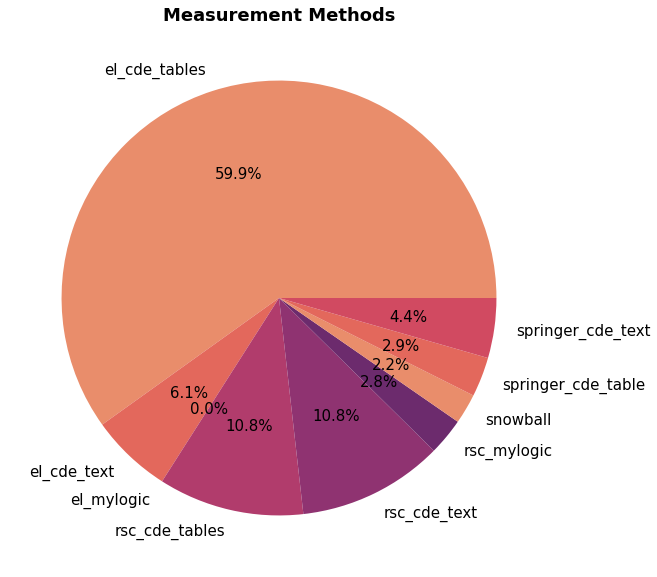

In [19]:
# Define the color palette to use
colors = sns.color_palette("flare")

# Group the data by measurement method and get the sum of the encoded values
grouped_data = df.groupby('measurement_method')['measurement_method_encoded'].sum()

# Set the figure size to be 2 times larger
plt.figure(figsize=(10, 10))

# Set font properties
plt.rcParams.update({'font.size': 15, 'font.weight': 'normal'})

# Create the pie chart
plt.pie(grouped_data, labels=grouped_data.index, colors=colors, autopct='%1.1f%%')

# Add a title to the chart
plt.title('Measurement Methods', fontweight='bold')

# Show the chart
plt.show()

### Histograms

Histograms are commonly used to visualize the distribution of a numerical variable. They are particularly useful when you want to:

1) Identify the central tendency of the data (e.g., the mean, median, mode)

2) Identify the spread or dispersion of the data (e.g., the range, variance, standard deviation)

3) Identify the shape of the distribution (e.g., normal, skewed, bimodal)

4) Identify outliers or unusual values

5) Compare the distributions of different variables or groups

Histograms can also be used to identify patterns or trends in the data, such as gaps or clusters of values. They are a simple and effective way to summarize large amounts of data and make it easier to understand. Overall, histograms are a convenient way to explore and analyze numerical data.

ValueError: Maximum allowed size exceeded

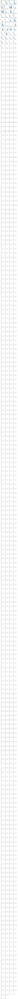

In [23]:
# Select only the numeric columns
numeric_cols = df.select_dtypes(include=['float64'])

# Define a function to plot the histograms using seaborn.FacetGrid
def plot_hist(x, **kwargs):
    sns.histplot(x=x, **kwargs)

# Use seaborn.FacetGrid to plot histograms of each numeric column
g = sns.FacetGrid(pd.melt(numeric_cols), col="variable", col_wrap=4, sharex=False, sharey=False)
g = g.map_dataframe(plot_hist, x="value")

# Show the plot
g.fig.tight_layout()
g.fig.show()

In [3]:
# Find columns containing only one value
single_value_cols = df.columns[df.nunique() == 1]

# Extract the columns containing only one value
df_single_value = df[single_value_cols]

In [27]:
print(df_single_value.shape)

(2941, 383)


In [4]:
# Drop the columns containing only one value
df = df.drop(columns=single_value_cols)

In [29]:
print(df.shape)

(2941, 1668)


In [ ]:
# calculate the percentage of NaN values in each column
percent_missing = df.isna().mean() * 100
# print the result
print(percent_missing)

AxesSubplot(0.125,0.125;0.775x0.755)


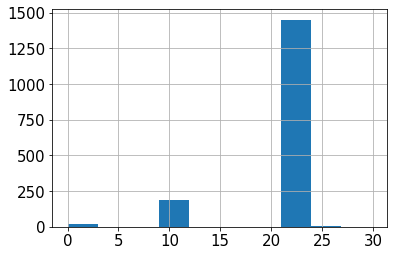

In [41]:
print(percent_missing.hist())

In [5]:
# create a boolean mask for rows with NA values in column ABC
na_mask = df['ABC'].isna()

# use the boolean mask to select rows with NA values in column ABC
df_with_NA = df[na_mask]

# use the inverse of the boolean mask to select rows without NA values in column ABC
df_without_NA = df[~na_mask]

DOI                  0.000000
Date                 0.000000
Journal              0.000000
Title                0.000000
Name                 0.000000
                      ...    
xlogp               26.349206
tpsa                 0.000000
exact_mass           0.000000
molecular_weight     0.000000
complexity           0.000000
Length: 1668, dtype: float64
AxesSubplot(0.125,0.125;0.775x0.755)


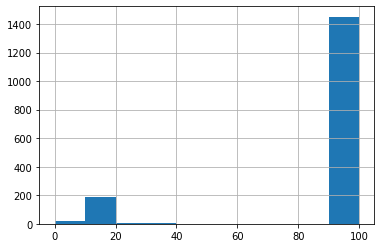

In [6]:
percent_missing_with = df_with_NA.isna().mean() * 100
print(percent_missing_with)
print(percent_missing_with.hist())

In [7]:
# calculate the percentage of missing values for each column in df_with_NA
percent_missing_with = df_with_NA.isna().mean() * 100

# select the columns where all values are missing
all_missing_cols = percent_missing_with[percent_missing_with == 100].index

# drop the columns where all values are missing
df_with_NA = df_with_NA.drop(columns=all_missing_cols)

In [50]:
df_with_NA.shape

(630, 217)

DOI                  0.000000
Date                 0.000000
Journal              0.000000
Title                0.000000
Name                 0.000000
                      ...    
xlogp               30.852445
tpsa                 0.000000
exact_mass           0.000000
molecular_weight     0.000000
complexity           0.000000
Length: 1668, dtype: float64
AxesSubplot(0.125,0.125;0.775x0.755)


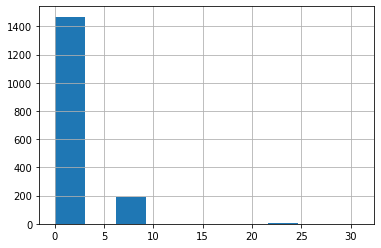

In [8]:
percent_missing_without = df_without_NA.isna().mean() * 100
print(percent_missing_without)
print(percent_missing_without.hist())

In [51]:
df_without_NA.shape

(2311, 1668)

### PCA and UMAP

In [9]:
def PCA_reduction(df: pd.DataFrame,
                  n_components: int = 2) -> pd.DataFrame:
    """
    It takes a DataFrame, a column name, and a number of components, 
    and returns a DataFrame with the PCA results

    :param df: the DataFrame you want to perform PCA on
    :type df: pd.DataFrame
    :param n_components: The number of principal components to keep
    :type n_components: int
    :return: A dataframe with the PCA results.
    """
    numeric_cols = df.select_dtypes(include='number').columns.tolist()
    non_numeric_cols = [colname for colname in df.columns if colname not in numeric_cols]

    X = df[numeric_cols]
    X_nn = df[non_numeric_cols]

    # Preprocess the data with StandardScaler
    X_scaled = StandardScaler().fit_transform(X)

    # Perform PCA
    pca = PCA(n_components=n_components)
    X_pca = pca.fit_transform(X_scaled)

    # Create a DataFrame with the PCA results
    pca_df = pd.DataFrame(data=X_pca, columns=[f'PC{i}' for i in range(1, n_components + 1)], index=X.index)
    pca_df = pd.merge(pca_df, X_nn, left_index=True, right_index=True)

    return pca_df

In [11]:
from sklearn.preprocessing import StandardScaler

In [ ]:
from sklearn.decomposition import PCA
df_PCA_result = PCA_reduction(df, 2)

In [13]:
def UMAP_reduction(df: pd.DataFrame,
                  n_components: int = 2) -> pd.DataFrame:
    """
    It takes a DataFrame, a column name, and a number of components, 
    and returns a DataFrame with the UMAP results

    :param df: the DataFrame you want to perform UMAP on
    :type df: pd.DataFrame
    :param n_components: The number of principal components to keep
    :type n_components: int
    :return: A dataframe with the UMAP results.
    """
    numeric_cols = df.select_dtypes(include='number').columns.tolist()
    non_numeric_cols = [colname for colname in df.columns if colname not in numeric_cols]

    X = df[numeric_cols]
    X_nn = df[non_numeric_cols]

    
    # Perform UMAP
    umap_model = umap.UMAP(n_components=n_components, n_epochs=2_000)
    X_umap = umap_model.fit_transform(X)

    # Create a DataFrame with the UMAP results
    umap_df = pd.DataFrame(data=X_umap, columns=[f'UMAP{i}' for i in range(1, n_components + 1)], index=X.index)
    umap_df = pd.merge(umap_df, X_nn, left_index=True, right_index=True)

    return umap_df

In [14]:
from typing import List

In [47]:
def plot_2d(df: pd.DataFrame,
           hue_column: str,
           components: List[int] = [1, 2]) -> None:
    """
    It creates a scatter plot of the 2 selected components, colored by the group column
    
    :param df: The dataframe containing the data to plot
    :type df: pd.DataFrame
    :param hue_column: The column in the dataframe that contains the labels for the different groups
    :type hue_column: str
    :param components: The components to plot
    :type components: List[int]
    """
    df = df.sort_values(hue_column)
    components_zero_based = [comp - 1 for comp in components]
    # Create a scatter plot of the PCA results, colored by the group column
    plt.figure(figsize=(18,16))
    x_colname, y_colname = df.iloc[:, components_zero_based].columns.tolist()
    ax = sns.scatterplot(x=x_colname, 
                         y=y_colname, 
                         hue=df[hue_column], 
                         data=df.iloc[:, components_zero_based])
    sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
    

    plt.show()

#### df_with_NA

In [52]:
df_with_NA.head()

,DOI,Date,Journal,Title,Name,measurement_error,measurement_method,measurement_method_encoded,isomeric_smiles,isomeric_smiles_freq_encoded,raw_value,specifier,specifier_freq_encoded,cid,MaxEStateIndex,MinEStateIndex,MaxAbsEStateIndex,MinAbsEStateIndex,qed,MolWt,HeavyAtomMolWt,ExactMolWt,NumValenceElectrons,NumRadicalElectrons,MinPartialCharge,MinAbsPartialCharge,FpDensityMorgan1,FpDensityMorgan2,FpDensityMorgan3,BCUT2D_MWHI,BCUT2D_MWLOW,BCUT2D_CHGHI,BCUT2D_CHGLO,BCUT2D_LOGPHI,BCUT2D_LOGPLOW,BCUT2D_MRHI,BCUT2D_MRLOW,BalabanJ,BertzCT,Chi0,Chi0n,Chi0v,Chi1,Chi1n,Chi1v,Chi2n,Chi2v,Chi3n,Chi3v,Chi4n,Chi4v,HallKierAlpha,Ipc,Kappa1,Kappa2,Kappa3,LabuteASA,PEOE_VSA1,PEOE_VSA10,PEOE_VSA11,PEOE_VSA12,PEOE_VSA13,PEOE_VSA14,PEOE_VSA2,PEOE_VSA3,PEOE_VSA4,PEOE_VSA5,PEOE_VSA6,PEOE_VSA7,PEOE_VSA8,PEOE_VSA9,SMR_VSA1,SMR_VSA10,SMR_VSA2,SMR_VSA3,SMR_VSA4,SMR_VSA5,SMR_VSA6,SMR_VSA7,SMR_VSA9,SlogP_VSA1,SlogP_VSA10,SlogP_VSA11,SlogP_VSA12,SlogP_VSA2,SlogP_VSA3,SlogP_VSA4,SlogP_VSA5,SlogP_VSA6,SlogP_VSA7,SlogP_VSA8,TPSA,EState_VSA1,EState_VSA10,EState_VSA11,EState_VSA2,EState_VSA3,EState_VSA4,EState_VSA5,EState_VSA6,EState_VSA7,EState_VSA8,EState_VSA9,VSA_EState1,VSA_EState10,VSA_EState2,VSA_EState3,VSA_EState4,VSA_EState5,VSA_EState6,VSA_EState7,VSA_EState8,VSA_EState9,FractionCSP3,HeavyAtomCount,NHOHCount,NOCount,NumAliphaticCarbocycles,NumAliphaticHeterocycles,NumAliphaticRings,NumAromaticCarbocycles,NumAromaticHeterocycles,NumAromaticRings,NumHAcceptors,NumHDonors,NumHeteroatoms,NumRotatableBonds,NumSaturatedCarbocycles,NumSaturatedHeterocycles,NumSaturatedRings,RingCount,MolLogP,MolMR,fr_Al_COO,fr_Al_OH,fr_Al_OH_noTert,fr_ArN,fr_Ar_COO,fr_Ar_N,fr_Ar_NH,fr_Ar_OH,fr_COO,fr_COO2,fr_C_O,fr_C_O_noCOO,fr_C_S,fr_Imine,fr_NH0,fr_NH1,fr_NH2,fr_N_O,fr_Ndealkylation1,fr_Ndealkylation2,fr_Nhpyrrole,fr_SH,fr_aldehyde,fr_alkyl_carbamate,fr_alkyl_halide,fr_allylic_oxid,fr_amide,fr_amidine,fr_aniline,fr_aryl_methyl,fr_azo,fr_barbitur,fr_benzene,fr_bicyclic,fr_dihydropyridine,fr_epoxide,fr_ester,fr_ether,fr_furan,fr_guanido,fr_halogen,fr_hdrzine,fr_hdrzone,fr_imidazole,fr_imide,fr_isocyan,fr_isothiocyan,fr_ketone,fr_ketone_Topliss,fr_lactam,fr_lactone,fr_methoxy,fr_morpholine,fr_nitrile,fr_nitro,fr_nitro_arom,fr_nitro_arom_nonortho,fr_nitroso,fr_oxime,fr_para_hydroxylation,fr_phenol,fr_phenol_noOrthoHbond,fr_phos_acid,fr_phos_ester,fr_piperdine,fr_piperzine,fr_priamide,fr_pyridine,fr_quatN,fr_sulfide,fr_sulfonamd,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiocyan,fr_thiophene,fr_unbrch_alkane,fr_urea,xlogp,tpsa,exact_mass,molecular_weight,complexity
2311,10.1016/j.fluid.2011.06.011,6/14/2011,Fluid Phase Equilibria,"Thermophysical behaviour of the mixture (±)-3,...",(±)-linalool,0.0,el_mylogic,0.000,CC(=CCCC(C)(C=C)O)C,0.044444,0.268406,nD,0.458373,0.000040,0.621316,0.479675,0.621316,0.087804,0.646874,0.053679,0.047660,0.053642,0.101266,0.0,0.373415,0.019989,0.386364,0.522727,0.613636,0.120362,0.071415,0.746391,0.319851,0.838643,0.345740,0.331144,0.069034,5.604053e-01,0.025178,0.099638,0.128947,0.128947,0.086783,0.119664,0.119664,0.129594,0.069525,0.073014,0.023419,0.033561,0.007177,0.624416,2.699520e-34,0.018778,0.042764,0.009884,0.099583,0.028406,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.141776,0.061027,0.275284,0.000000,0.063186,0.022425,0.000000,0.0,0.000000,0.000000,0.11703,0.000000,0.137341,0.000000,0.000000,0.000000,0.000000,0.0,0.028279,0.00000,0.000000,0.102176,0.166932,0.0,0.000000,0.026003,0.017227,0.031673,0.0,0.000000,0.000000,0.143723,0.024110,0.040225,0.0,0.164574,0.000000,0.007225,0.414215,0.016097,0.062019,0.230264,0.899658,0.195691,0.602174,0.459069,0.381639,0.600000,0.090164,0.04,0.021739,0.0,0.0,0.000000,0.00000,0.0,0.00000,0.021739,0.04,0.021739,0.075472,0.0,0.0,0.0,0.00000,0.575650,0.129273,0.0,0.043478,0.000000,0.0,0.0,0.000000,0.0,0.00,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.2,0.000000,0.0,0.00,0.000,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.

In [16]:
df_with_NA = df_with_NA.dropna(axis=0, how='any')

In [17]:
pca_df_with = PCA_reduction(df_with_NA, n_components=2)
# print the resulting dataframe
print(pca_df_with)

            PC1       PC2                             DOI        Date  \
2311   0.780888 -2.056204     10.1016/j.fluid.2011.06.011   6/14/2011   
2312  16.828627 -8.420766              10.1039/C5NR08190D    1/7/2016   
2313  20.842403 -3.688845      10.1016/j.ejps.2008.07.010   8/13/2008   
2315  -1.605999 -1.487081   10.1016/S1090-7807(03)00142-3   6/20/2003   
2318  -3.009025  1.403386  10.1016/j.ceramint.2015.06.124    7/3/2015   
...         ...       ...                             ...         ...   
2931   4.647983  5.230623       10.1016/j.jct.2008.09.009   9/19/2008   
2932  -3.325296 -2.978126   10.1016/S0378-3812(00)00429-5  11/30/2000   
2934   1.503384 -1.329233   10.1016/j.polymer.2017.11.057  11/24/2017   
2937  -1.964261 -3.876172    10.1016/j.molliq.2013.09.035  10/17/2013   
2938  -2.806858  0.997916                10.1039/B413474E   1/20/2005   

                                          Journal  \
2311                       Fluid Phase Equilibria   
2312             

In [22]:
import umap

In [23]:
umap_with_NA = UMAP_reduction(df_with_NA, n_components=2)

In [24]:
print(umap_with_NA)

          UMAP1      UMAP2                             DOI        Date  \
2311  12.715792 -10.363598     10.1016/j.fluid.2011.06.011   6/14/2011   
2312  12.767041  -9.953565              10.1039/C5NR08190D    1/7/2016   
2313  13.141488 -10.231541      10.1016/j.ejps.2008.07.010   8/13/2008   
2315  10.959139  -7.257590   10.1016/S1090-7807(03)00142-3   6/20/2003   
2318  13.300412 -13.593432  10.1016/j.ceramint.2015.06.124    7/3/2015   
...         ...        ...                             ...         ...   
2931  14.138747  -9.818109       10.1016/j.jct.2008.09.009   9/19/2008   
2932   9.706059  -5.903126   10.1016/S0378-3812(00)00429-5  11/30/2000   
2934  11.922311 -11.043303   10.1016/j.polymer.2017.11.057  11/24/2017   
2937  10.207270  -5.814017    10.1016/j.molliq.2013.09.035  10/17/2013   
2938  15.704568 -12.288122                10.1039/B413474E   1/20/2005   

                                          Journal  \
2311                       Fluid Phase Equilibria   
2312 

In [29]:
pd.set_option('display.max_columns', None)
umap_with_NA.head()

,UMAP1,UMAP2,DOI,Date,Journal,Title,Name,measurement_method,isomeric_smiles,specifier
2311,12.715792,-10.363598,10.1016/j.fluid.2011.06.011,6/14/2011,Fluid Phase Equilibria,"Thermophysical behaviour of the mixture (±)-3,...",(±)-linalool,el_mylogic,CC(=CCCC(C)(C=C)O)C,nD
2312,12.767041,-9.953565,10.1039/C5NR08190D,1/7/2016,Nanoscale,Noncovalent functionalization of solid-state n...,ATR,rsc_cde_text,CN1C=NC=C1C2=C(C=NC=C2NC(=O)C3=C4N=CC(=CN4N=C3...,refractive index
2313,13.141488,-10.231541,10.1016/j.ejps.2008.07.010,8/13/2008,European Journal of Pharmaceutical Sciences,Interaction of mitoxantrone with human serum a...,mitoxantrone,el_mylogic,C1=CC(=C2C(=C1NCCNCCO)C(=O)C3=C(C=CC(=C3C2=O)O...,n
2315,10.959139,-7.257590,10.1016/S1090-7807(03)00142-3,6/20/2003,Journal of Magnetic Resonance,Variations on the chemical shift of TMS,Benzene-d6,el_mylogic,c1(c(c(c(c(c1[2H])[2H])[2H])[2H])[2H])[2H],n
2318,13.300412,-13.593432,10.1016/j.ceramint.2015.06.124,7/3/2015,Ceramics International,Recent development on preparation of ceramic i...,2-Propanol,el_mylogic,CC(C)O,Refractive index


In [30]:
print(umap_with_NA.shape)

(325, 10)


After all the transformations, there in no usefull information last

#### df_without_NA

In [53]:
df_without_NA.head()

DOI        Date  \
0  10.1016/j.optlaseng.2008.09.005   1/14/2009   
1       10.1016/j.jiec.2018.12.038  12/29/2018   
2     10.1016/j.jlumin.2015.02.010   2/14/2015   
3                 10.1039/B717069F    3/7/2023   
4      10.1529/biophysj.106.094946  10/23/2008   

                                           Journal  \
0                 Optics and Lasers in Engineering   
1  Journal of Industrial and Engineering Chemistry   
2                          Journal of Luminescence   
3                                  J. Mater. Chem.   
4                              Biophysical Journal   

                                               Title        Name  \
0  A high-precision measurement technique for eva...     Alcohol   
1  Improving understanding of solvent effects on ...  aceticacid   
2  Spectroscopic properties of tellurite glasses ...   Phosphate   
3  High refractive index polyimide–nanocrystallin...         BK7   
4  Quantitative Characterization of Biological Li...     ethanol   

   measurement_error measurement_method  measurement_method_encoded  \
0           0.000000         el_mylogic                       0.000   
1           0.000000         el_mylogic                       0.000   
2           0.000000         el_mylogic                       0.000   
3           0.000000           snowball                       0.125   
4           0.000191        el_cde_text                       0.250   

                                     isomeric_smiles  \
0                                                CCO   
1                                            CC(O)=O   
2                              [O-][P]([O-])([O-])=O   
3  CCOC1=CC2=C(C=C1)C=C(C=C2)C3=NN(C4=NC=NC(=C34)...   
4                                                CCO   

   isomeric_smiles_freq_encoded  raw_value                   specifier  \
0                      0.822222   0.211218        Refractive index (n)   
1                      0.077778   0.425656                           n   
2                      0.066667   0.328325  Refractive index (~600 nm)   
3                      0.044444   0.314942            refractive index   
4                      0.822222   0.215385            refractive index   

   specifier_freq_encoded       cid  MaxEStateIndex  MinEStateIndex  \
0                0.030622  0.000004        0.495640        0.536622   
1                1.000000  0.000001        0.589311        0.471849   
2                0.000957  0.000006        0.559755        0.199469   
3                0.286124  0.329198        0.410928        0.549817   
4                0.286124  0.000004        0.495640        0.536622   

   MaxAbsEStateIndex  MinAbsEStateIndex       qed     MolWt  HeavyAtomMolWt  \
0           0.495640           0.031250  0.419109  0.015784        0.014014   
1           0.589311           0.104167  0.444098  0.020682        0.019616   
2           0.559755           0.673611  0.307064  0.032913        0.033255   
3           0.410928           0.058837  0.552241  0.140637        0.131764   
4           0.495640           0.031250  0.419109  0.015784        0.014014   

   ExactMolWt  NumValenceElectrons  NumRadicalElectrons  MinPartialCharge  \
0    0.015776             0.031646                  0.0          0.371905   
1    0.020673             0.037975                  0.0          0.359795   
2    0.032910             0.050633                  0.0          0.311083   
3    0.140547             0.243671                  0.0          0.358019   
4    0.015776             0.031646                  0.0          0.371905   

   MinAbsPartialCharge  FpDensityMorgan1  FpDensityMorgan2  FpDensityMorgan3  \
0             0.010055             0.500             0.500          0.500000   
1             0.074921             0.500             0.500          0.500000   
2             0.039676             0.300             0.300          0.300000   
3             0.040869             0.275             0.475          0.683333   
4             0.010055

In [18]:
df_without_NA = df_without_NA.dropna(axis=0, how='any')

In [19]:
import os
os.environ['NotebookApp.iopub_data_rate_limit'] = '10000000'

In [20]:
pca_df_without = PCA_reduction(df_without_NA, n_components=2)
# print the resulting dataframe
print(pca_df_without)

            PC1        PC2                              DOI        Date  \
0     -6.284470  -4.497894  10.1016/j.optlaseng.2008.09.005   1/14/2009   
1     -5.005861  -3.010862       10.1016/j.jiec.2018.12.038  12/29/2018   
2     -4.248887  -2.208209     10.1016/j.jlumin.2015.02.010   2/14/2015   
3     32.514692  14.966441                 10.1039/B717069F    3/7/2023   
4     -6.287753  -4.472906      10.1529/biophysj.106.094946  10/23/2008   
...         ...        ...                              ...         ...   
2305  -1.822595  -3.726177     10.1016/j.molliq.2016.04.011   4/30/2016   
2306   3.440264  -2.338933    10.1016/S0304-3894(03)00199-7   7/30/2003   
2308  30.207931  -4.777474                 10.1039/B814616K   3/24/2009   
2309  -5.105885   3.224743        10.1016/j.jct.2010.09.008   9/23/2010   
2310   4.778745  -2.976341      10.1016/j.nainr.2003.08.005  10/29/2003   

                                                Journal  \
0                      Optics and Lasers

In [31]:
pd.set_option('display.max_columns', None)
pca_df_without.head()

PC1        PC2                              DOI        Date  \
0  -6.284470  -4.497894  10.1016/j.optlaseng.2008.09.005   1/14/2009   
1  -5.005861  -3.010862       10.1016/j.jiec.2018.12.038  12/29/2018   
2  -4.248887  -2.208209     10.1016/j.jlumin.2015.02.010   2/14/2015   
3  32.514692  14.966441                 10.1039/B717069F    3/7/2023   
4  -6.287753  -4.472906      10.1529/biophysj.106.094946  10/23/2008   

                                           Journal  \
0                 Optics and Lasers in Engineering   
1  Journal of Industrial and Engineering Chemistry   
2                          Journal of Luminescence   
3                                  J. Mater. Chem.   
4                              Biophysical Journal   

                                               Title        Name  \
0  A high-precision measurement technique for eva...     Alcohol   
1  Improving understanding of solvent effects on ...  aceticacid   
2  Spectroscopic properties of tellurite glasses ...   Phosphate   
3  High refractive index polyimide–nanocrystallin...         BK7   
4  Quantitative Characterization of Biological Li...     ethanol   

  measurement_method                                    isomeric_smiles  \
0         el_mylogic                                                CCO   
1         el_mylogic                                            CC(O)=O   
2         el_mylogic                              [O-][P]([O-])([O-])=O   
3           snowball  CCOC1=CC2=C(C=C1)C=C(C=C2)C3=NN(C4=NC=NC(=C34)...   
4        el_cde_text                                                CCO   

                    specifier             SpAbs_A             SpMax_A  \
0        Refractive index (n)    2.82842712474619   1.414213562373095   
1                           n  3.4641016151377544  1.7320508075688772   
2  Refractive index (~600 nm)                 4.0                 2.0   
3            refractive index  40.160820843817994   2.527934725905339   
4            refractive index    2.82842712474619   1.414213562373095   

             SpDiam_A              SpAD_A             SpMAD_A  \
0    2.82842712474619    2.82842712474619  0.9428090415820632   
1  3.4641016151377544  3.4641016151377544  0.8660254037844386   
2                 4.0                 4.0                 0.8   
3  4.9476159174023735  40.160820843817994  1.3386940281272666   
4    2.82842712474619    2.82842712474619  0.9428090415820632   

              LogEE_A               VE1_A                VE2_A  \
0  1.8494570055365824  1.7071067811865472    0.569035593728849   
1  2.1780592999959434  1.9318516525781366  0.48296291314453416   
2  2.4444657789995543   2.121320343559643  0.42426406871192857   
3  4.3540820830700335    4.41511893428507  0.14717063114283568   
4  1.8494570055365824  1.7071067811865472    0.569035593728849   

                  VE3_A              VR1_A               VR2_A  \
0   -0.6691728075863657  3.363585661014859  1.1211952203382862   
1   -0.2578117834117466  5.583629154612597  1.3959072886531492   
2  0.058891517828191846  7.999999999999999  1.5999999999999999   
3    2.5836470610441085  449.0706703453631  14.969022344845436   
4   -0.6691728075863657  3.363585661014859  1.1211952203382862   

                  VR3_A               ATS0s               ATS1s  \
0  0.009034761653968602               48.25                27.0   
1    0.8035482192409547   95.77777777777777                37.0   
2    1.3862943611198906  241.09717459228776    9.66358024691358   
3     7.205792559003611               161.0  176.47222222222223   
4  0.009034761653968602               48.25                27.0   

               ATS2s              ATS3s               ATS4s  \
0               38.0               28.0                 3.0   
1  77.66666666666664               48.0                 3.0   
2              360.0                0.0                 0.0   
3  289.3333333333334  347.6111111111112  366.08333333333337   
4               38.0               28.0          

In [32]:
pca_df_without.shape

(1524, 876)

In [25]:
umap_without_NA = UMAP_reduction(df_without_NA, n_components=2)
print(umap_without_NA)

          UMAP1      UMAP2                              DOI        Date  \
0     10.551867  11.242757  10.1016/j.optlaseng.2008.09.005   1/14/2009   
1     11.262777   9.977752       10.1016/j.jiec.2018.12.038  12/29/2018   
2      8.389362   9.453031     10.1016/j.jlumin.2015.02.010   2/14/2015   
3     14.911661   3.260293                 10.1039/B717069F    3/7/2023   
4     10.554944  11.157038      10.1529/biophysj.106.094946  10/23/2008   
...         ...        ...                              ...         ...   
2305  12.193067   8.533540     10.1016/j.molliq.2016.04.011   4/30/2016   
2306  14.263218   8.907241    10.1016/S0304-3894(03)00199-7   7/30/2003   
2308  14.105894   4.845960                 10.1039/B814616K   3/24/2009   
2309  10.974474   9.651185        10.1016/j.jct.2010.09.008   9/23/2010   
2310  15.843800   5.125836      10.1016/j.nainr.2003.08.005  10/29/2003   

                                                Journal  \
0                      Optics and Lasers

In [33]:
pd.set_option('display.max_columns', None)
umap_without_NA.head()

UMAP1      UMAP2                              DOI        Date  \
0  10.551867  11.242757  10.1016/j.optlaseng.2008.09.005   1/14/2009   
1  11.262777   9.977752       10.1016/j.jiec.2018.12.038  12/29/2018   
2   8.389362   9.453031     10.1016/j.jlumin.2015.02.010   2/14/2015   
3  14.911661   3.260293                 10.1039/B717069F    3/7/2023   
4  10.554944  11.157038      10.1529/biophysj.106.094946  10/23/2008   

                                           Journal  \
0                 Optics and Lasers in Engineering   
1  Journal of Industrial and Engineering Chemistry   
2                          Journal of Luminescence   
3                                  J. Mater. Chem.   
4                              Biophysical Journal   

                                               Title        Name  \
0  A high-precision measurement technique for eva...     Alcohol   
1  Improving understanding of solvent effects on ...  aceticacid   
2  Spectroscopic properties of tellurite glasses ...   Phosphate   
3  High refractive index polyimide–nanocrystallin...         BK7   
4  Quantitative Characterization of Biological Li...     ethanol   

  measurement_method                                    isomeric_smiles  \
0         el_mylogic                                                CCO   
1         el_mylogic                                            CC(O)=O   
2         el_mylogic                              [O-][P]([O-])([O-])=O   
3           snowball  CCOC1=CC2=C(C=C1)C=C(C=C2)C3=NN(C4=NC=NC(=C34)...   
4        el_cde_text                                                CCO   

                    specifier             SpAbs_A             SpMax_A  \
0        Refractive index (n)    2.82842712474619   1.414213562373095   
1                           n  3.4641016151377544  1.7320508075688772   
2  Refractive index (~600 nm)                 4.0                 2.0   
3            refractive index  40.160820843817994   2.527934725905339   
4            refractive index    2.82842712474619   1.414213562373095   

             SpDiam_A              SpAD_A             SpMAD_A  \
0    2.82842712474619    2.82842712474619  0.9428090415820632   
1  3.4641016151377544  3.4641016151377544  0.8660254037844386   
2                 4.0                 4.0                 0.8   
3  4.9476159174023735  40.160820843817994  1.3386940281272666   
4    2.82842712474619    2.82842712474619  0.9428090415820632   

              LogEE_A               VE1_A                VE2_A  \
0  1.8494570055365824  1.7071067811865472    0.569035593728849   
1  2.1780592999959434  1.9318516525781366  0.48296291314453416   
2  2.4444657789995543   2.121320343559643  0.42426406871192857   
3  4.3540820830700335    4.41511893428507  0.14717063114283568   
4  1.8494570055365824  1.7071067811865472    0.569035593728849   

                  VE3_A              VR1_A               VR2_A  \
0   -0.6691728075863657  3.363585661014859  1.1211952203382862   
1   -0.2578117834117466  5.583629154612597  1.3959072886531492   
2  0.058891517828191846  7.999999999999999  1.5999999999999999   
3    2.5836470610441085  449.0706703453631  14.969022344845436   
4   -0.6691728075863657  3.363585661014859  1.1211952203382862   

                  VR3_A               ATS0s               ATS1s  \
0  0.009034761653968602               48.25                27.0   
1    0.8035482192409547   95.77777777777777                37.0   
2    1.3862943611198906  241.09717459228776    9.66358024691358   
3     7.205792559003611               161.0  176.47222222222223   
4  0.009034761653968602               48.25                27.0   

               ATS2s              ATS3s               ATS4s  \
0               38.0               28.0                 3.0   
1  77.66666666666664               48.0                 3.0   
2              360.0                0.0                 0.0   
3  289.3333333333334  347.6111111111112  366.08333333333337   
4               38.0               28.0        

In [34]:
umap_without_NA.shape

(1524, 876)

In [36]:
umap_without_NA.to_csv('umap_without_NA.tsv', sep='\t', index=False)
pca_df_without.to_csv('pca_without_NA.tsv', sep='\t', index=False)

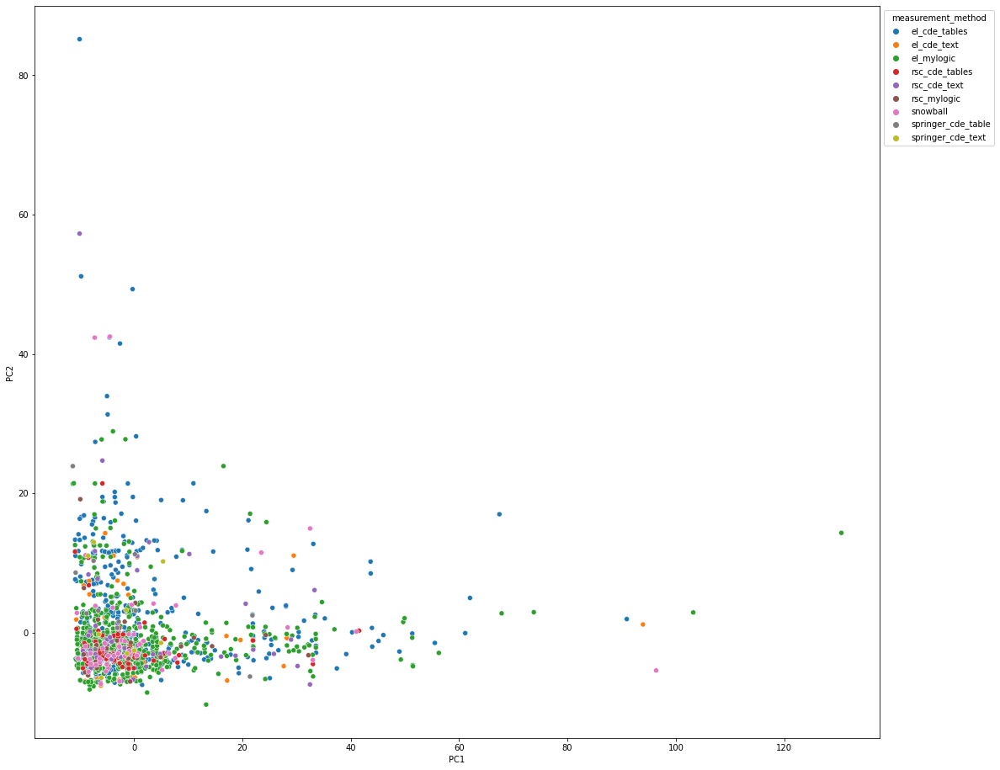

In [53]:
plot_2d(pca_df_without, hue_column='measurement_method')

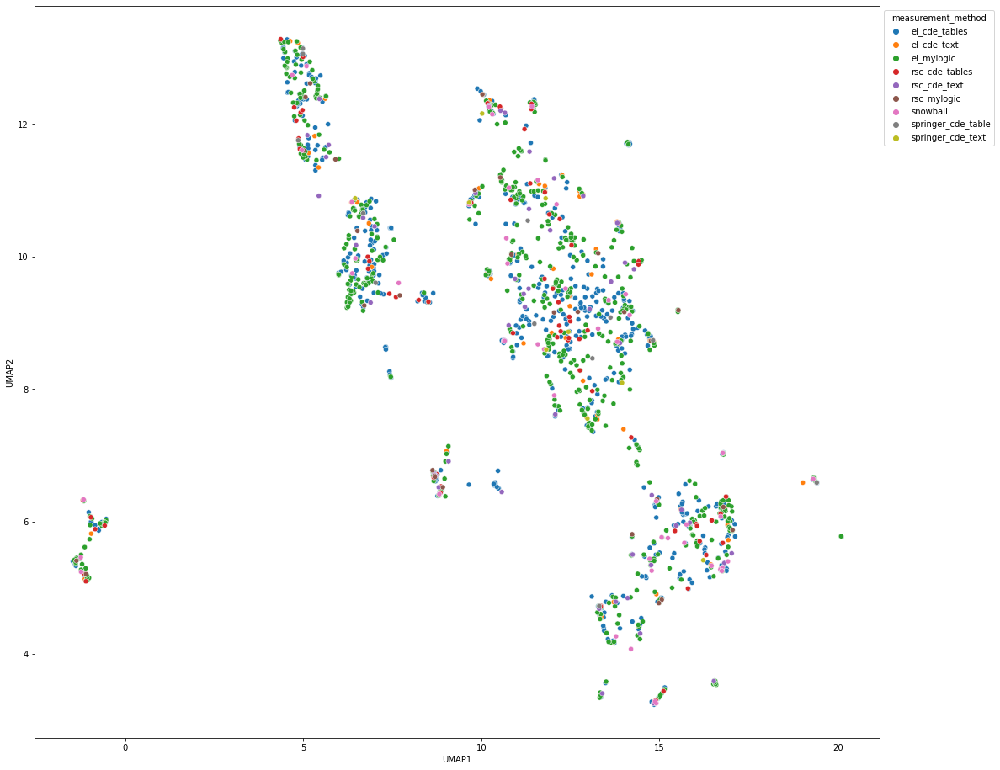

In [54]:
plot_2d(umap_without_NA, hue_column='measurement_method')

It doesn't look like something usefull, unfortunatelly

### Box Plot

Box plots are useful for visualizing the distribution of a dataset and for identifying outliers. Box plots are particularly useful when comparing the distribution of a variable across different groups. In this case, a box plot can be used to visualize the range and median of the variable for each group, as well as any outliers. This can help to identify differences in the distribution of the variable between the groups.

C:\Users\bocha\AppData\Local\Temp\ipykernel_18100\4068356743.py:14: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  g.fig.show()


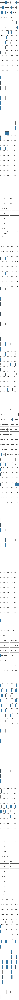

In [51]:
# Select only the numeric columns
numeric_cols = df.select_dtypes(include=['float64'])

# Define a function to plot the box plots using seaborn.boxplot
def plot_box(x, **kwargs):
    sns.boxplot(x=x, **kwargs)

# Use seaborn.FacetGrid to plot box plots of each numeric column
g = sns.FacetGrid(pd.melt(numeric_cols), col="variable", col_wrap=4, sharex=False, sharey=False)
g = g.map_dataframe(plot_box, x="value")

# Show the plot
g.fig.tight_layout()
g.fig.show()

Box plots can also be useful for identifying skewness and outliers in the distribution of a single variable. A skewed distribution may have a box that is asymmetrical or that is shifted to one side of the plot, while outliers will be plotted as individual points outside the whiskers.

It is visible, in some cases boxes in a box plot are not visible and there are only dots, it typically means that the data are highly skewed and/or there are many outliers in the data. When this happens, the whiskers of the box plot are shortened to the minimum and maximum values that are not considered outliers, and the remaining points are plotted as individual dots.

### Violin Plot

Violin plots are useful for visually representing the distribution of a dataset. They are a combination of a box plot and a kernel density plot, and provide more information about the underlying distribution of the data than a traditional box plot.

C:\Users\bocha\AppData\Local\Temp\ipykernel_18100\1239305379.py:14: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  g.fig.show()


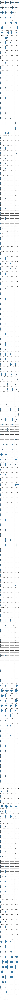

In [52]:
# Select only the numeric columns
numeric_cols = df.select_dtypes(include=['float64'])

# Define a function to plot the violin plots using seaborn.violinplot
def plot_violin(x, **kwargs):
    sns.violinplot(x=x, **kwargs)

# Use seaborn.FacetGrid to plot violin plots of each numeric column
g = sns.FacetGrid(pd.melt(numeric_cols), col="variable", col_wrap=4, sharex=False, sharey=False)
g = g.map_dataframe(plot_violin, x="value")

# Show the plot
g.fig.tight_layout()
g.fig.show()

One of the advantages of violin plots is that they can easily display multiple distributions side-by-side, making them useful for comparing different groups or subgroups within a dataset.

### Interractive plot

In [60]:
pd.set_option('display.max_columns', None)
df.head()

DOI        Date  \
0  10.1016/j.optlaseng.2008.09.005   1/14/2009   
1       10.1016/j.jiec.2018.12.038  12/29/2018   
2     10.1016/j.jlumin.2015.02.010   2/14/2015   
3                 10.1039/B717069F    3/7/2023   
4      10.1529/biophysj.106.094946  10/23/2008   

                                           Journal  \
0                 Optics and Lasers in Engineering   
1  Journal of Industrial and Engineering Chemistry   
2                          Journal of Luminescence   
3                                  J. Mater. Chem.   
4                              Biophysical Journal   

                                               Title        Name  \
0  A high-precision measurement technique for eva...     Alcohol   
1  Improving understanding of solvent effects on ...  aceticacid   
2  Spectroscopic properties of tellurite glasses ...   Phosphate   
3  High refractive index polyimide–nanocrystallin...         BK7   
4  Quantitative Characterization of Biological Li...     ethanol   

   measurement_error measurement_method  measurement_method_encoded  \
0           0.000000         el_mylogic                       0.000   
1           0.000000         el_mylogic                       0.000   
2           0.000000         el_mylogic                       0.000   
3           0.000000           snowball                       0.125   
4           0.000191        el_cde_text                       0.250   

                                     isomeric_smiles  \
0                                                CCO   
1                                            CC(O)=O   
2                              [O-][P]([O-])([O-])=O   
3  CCOC1=CC2=C(C=C1)C=C(C=C2)C3=NN(C4=NC=NC(=C34)...   
4                                                CCO   

   isomeric_smiles_freq_encoded  raw_value                   specifier  \
0                      0.822222   0.211218        Refractive index (n)   
1                      0.077778   0.425656                           n   
2                      0.066667   0.328325  Refractive index (~600 nm)   
3                      0.044444   0.314942            refractive index   
4                      0.822222   0.215385            refractive index   

   specifier_freq_encoded       cid  MaxEStateIndex  MinEStateIndex  \
0                0.030622  0.000004        0.495640        0.536622   
1                1.000000  0.000001        0.589311        0.471849   
2                0.000957  0.000006        0.559755        0.199469   
3                0.286124  0.329198        0.410928        0.549817   
4                0.286124  0.000004        0.495640        0.536622   

   MaxAbsEStateIndex  MinAbsEStateIndex       qed     MolWt  HeavyAtomMolWt  \
0           0.495640           0.031250  0.419109  0.015784        0.014014   
1           0.589311           0.104167  0.444098  0.020682        0.019616   
2           0.559755           0.673611  0.307064  0.032913        0.033255   
3           0.410928           0.058837  0.552241  0.140637        0.131764   
4           0.495640           0.031250  0.419109  0.015784        0.014014   

   ExactMolWt  NumValenceElectrons  NumRadicalElectrons  MinPartialCharge  \
0    0.015776             0.031646                  0.0          0.371905   
1    0.020673             0.037975                  0.0          0.359795   
2    0.032910             0.050633                  0.0          0.311083   
3    0.140547             0.243671                  0.0          0.358019   
4    0.015776             0.031646                  0.0          0.371905   

   MinAbsPartialCharge  FpDensityMorgan1  FpDensityMorgan2  FpDensityMorgan3  \
0             0.010055             0.500             0.500          0.500000   
1             0.074921             0.500             0.500          0.500000   
2             0.039676             0.300             0.300          0.300000   
3             0.040869             0.275             0.475          0.683333   
4             0.010055

In [ ]:
pd.set_option('display.max_rows', None)
# calculate the percentage of NaN values in each column
percent_missing = df.isna().mean() * 100
# print the result
print(percent_missing)

In [69]:
import networkx as nx
import plotly.graph_objects as go
import pandas as pd

# Create a networkx graph object
G = nx.from_pandas_edgelist(df, source='measurement_method_encoded', target='raw_value', edge_attr=['molecular_weight'])

# Define the positions of the nodes using a layout algorithm
pos = nx.spring_layout(G)

# Create a plotly figure
fig = go.Figure()

# Add nodes to the figure
for node in G.nodes:
    x, y = pos[node]
    fig.add_trace(
        go.Scatter(
            x=[x],
            y=[y],
            mode='markers',
            marker=dict(size=10, color='blue'),
            text=node,
            hovertemplate='%{text}<extra></extra>'
        )
    )

# Add edges to the figure
for edge in G.edges:
    x0, y0 = pos[edge[0]]
    x1, y1 = pos[edge[1]]
    fig.add_trace(
        go.Scatter(
            x=[x0, x1],
            y=[y0, y1],
            mode='lines',
            line=dict(width=G.edges[edge]['molecular_weight']),
            text='',
            hoverinfo='none'
        )
    )

# Add interactivity
fig.update_layout(
    title='My Interactive Network Graph',
    hovermode='closest',
)

# Show the plot
fig.show()

According to the charts we made, you can see that there is a tendency to group up

## Statistical tests

### Categorical variable

Для начала, статистический тест нужно провести накатегориальном параметре. среди собранных дескрипторов нет категориальных дескрипторов, в основном числовые (в некоторые вмешаны строки, поэтому они имеют смешанный тип данных). Поэтому выберем категориальный параметр из тех, что были изначально в датасете.

In [78]:
from scipy.stats import chi2_contingency

# Perform the chi-squared test on the column
crosstab = pd.crosstab(index=df['measurement_method'], columns='count')
chi2, pval, dof, expected = chi2_contingency(crosstab)

# Print the results
print(f"Chi-squared statistic: {chi2:.4f}")
print(f"P-value: {pval:.4f}")
print(f"Degrees of freedom: {dof}")

Chi-squared statistic: 0.0000
P-value: 1.0000
Degrees of freedom: 0


In [80]:
# Define the two categorical variables
cat_var1 = 'specifier'
cat_var2 = 'measurement_method'

# Create a contingency table
cont_table = pd.crosstab(df[cat_var1], df[cat_var2])

# Calculate chi-squared test statistic, p-value, degrees of freedom, and expected frequencies
chi2_stat, p_val, dof, exp_freq = chi2_contingency(cont_table)

# Print the results
print(f'Chi-squared test statistic: {chi2_stat:.3f}')
print(f'p-value: {p_val:.3f}')
print(f'degrees of freedom: {dof}')
print('Expected frequencies:')
print(pd.DataFrame(exp_freq, index=cont_table.index, columns=cont_table.columns))

Chi-squared test statistic: 4643.634
p-value: 0.000
degrees of freedom: 1880
Expected frequencies:
measurement_method                                  el_cde_tables  \
specifier                                                           
AE refractive index (at the wavelength of 1.535...       0.338660   
Average refractive index                                 1.015981   
Average refractive index, nav                            0.338660   
Cauchy fitting parameters for refractive index           0.338660   
Cladding refractive index                                1.015981   
Cladding refractive index, n2                            0.338660   
Core refractive index                                    1.354641   
Coronary artery index (CRI)                              0.338660   
Dispersant RI [−]                                        0.338660   
Imaginary part of complex index of refraction (...       0.338660   
Index of refraction                                      6.095886   
Inde

The Chi-squared test statistic is a measure of the difference between the observed frequencies inyour data and the frequencies that would be expected if there were no association between the variables. In our case, the test statistic is 4643.634.

The p-value is the probability of observing a test statistic as extreme or more extreme than the one you observed, assuming that there is no association between the variables in the population. In our case, the p-value is 0.000, which means that it is very unlikely to observe such a large test statistic if there were no association between the variables.

The degrees of freedom are related to the number of categories in our data. In our case, there are 1880 degrees of freedom, which suggests that you have a large number of categories in our data.

Based on the results of the Chi-squared test, it seems likely that there is a significant association between the variables being tested.

In [ ]:
!pip install statsmodels

McNemar's test is a statistical test used to compare the proportions of paired nominal data, where each observation can fall into one of two categories.

In [83]:
from statsmodels.stats.contingency_tables import mcnemar
import pandas as pd

# create a contingency table
contingency_table = pd.crosstab(df['measurement_method'], df['specifier'])

# perform McNemar's test
result = mcnemar(contingency_table)

# print the results
print(f"McNemar's test statistic: {result.statistic:.3f}")
print(f"p-value: {result.pvalue:.3f}")

McNemar's test statistic: 0.000
p-value: 1.000


The test statistic for McNemar's test measures the difference between two proportions, and in this case, it is reported as 0.000. This suggests that there is no significant difference between the proportions of the two categories being compared. The p-value, reported as 1.000, is the probability of observing a test statistic as extreme as the one computed from the sample data, assuming that the null hypothesis is true. A p-value of 1.000 suggests that there is not enough evidence to reject the null hypothesis that there is no difference between the two proportions being compared.

### Numeric descriptors

In [84]:
import scipy.stats as stats

In [85]:
pd.set_option('display.max_columns', None)
df.head()

DOI        Date  \
0  10.1016/j.optlaseng.2008.09.005   1/14/2009   
1       10.1016/j.jiec.2018.12.038  12/29/2018   
2     10.1016/j.jlumin.2015.02.010   2/14/2015   
3                 10.1039/B717069F    3/7/2023   
4      10.1529/biophysj.106.094946  10/23/2008   

                                           Journal  \
0                 Optics and Lasers in Engineering   
1  Journal of Industrial and Engineering Chemistry   
2                          Journal of Luminescence   
3                                  J. Mater. Chem.   
4                              Biophysical Journal   

                                               Title        Name  \
0  A high-precision measurement technique for eva...     Alcohol   
1  Improving understanding of solvent effects on ...  aceticacid   
2  Spectroscopic properties of tellurite glasses ...   Phosphate   
3  High refractive index polyimide–nanocrystallin...         BK7   
4  Quantitative Characterization of Biological Li...     ethanol   

   measurement_error measurement_method  measurement_method_encoded  \
0           0.000000         el_mylogic                       0.000   
1           0.000000         el_mylogic                       0.000   
2           0.000000         el_mylogic                       0.000   
3           0.000000           snowball                       0.125   
4           0.000191        el_cde_text                       0.250   

                                     isomeric_smiles  \
0                                                CCO   
1                                            CC(O)=O   
2                              [O-][P]([O-])([O-])=O   
3  CCOC1=CC2=C(C=C1)C=C(C=C2)C3=NN(C4=NC=NC(=C34)...   
4                                                CCO   

   isomeric_smiles_freq_encoded  raw_value                   specifier  \
0                      0.822222   0.211218        Refractive index (n)   
1                      0.077778   0.425656                           n   
2                      0.066667   0.328325  Refractive index (~600 nm)   
3                      0.044444   0.314942            refractive index   
4                      0.822222   0.215385            refractive index   

   specifier_freq_encoded       cid  MaxEStateIndex  MinEStateIndex  \
0                0.030622  0.000004        0.495640        0.536622   
1                1.000000  0.000001        0.589311        0.471849   
2                0.000957  0.000006        0.559755        0.199469   
3                0.286124  0.329198        0.410928        0.549817   
4                0.286124  0.000004        0.495640        0.536622   

   MaxAbsEStateIndex  MinAbsEStateIndex       qed     MolWt  HeavyAtomMolWt  \
0           0.495640           0.031250  0.419109  0.015784        0.014014   
1           0.589311           0.104167  0.444098  0.020682        0.019616   
2           0.559755           0.673611  0.307064  0.032913        0.033255   
3           0.410928           0.058837  0.552241  0.140637        0.131764   
4           0.495640           0.031250  0.419109  0.015784        0.014014   

   ExactMolWt  NumValenceElectrons  NumRadicalElectrons  MinPartialCharge  \
0    0.015776             0.031646                  0.0          0.371905   
1    0.020673             0.037975                  0.0          0.359795   
2    0.032910             0.050633                  0.0          0.311083   
3    0.140547             0.243671                  0.0          0.358019   
4    0.015776             0.031646                  0.0          0.371905   

   MinAbsPartialCharge  FpDensityMorgan1  FpDensityMorgan2  FpDensityMorgan3  \
0             0.010055             0.500             0.500          0.500000   
1             0.074921             0.500             0.500          0.500000   
2             0.039676             0.300             0.300          0.300000   
3             0.040869             0.275             0.475          0.683333   
4             0.010055

In [ ]:
# calculate the percentage of NaN values in each column
percent_missing = df.isna().mean() * 100
# print the result
print(percent_missing)

In [87]:
numeric_descriptors = ['exact_mass', 'molecular_weight', 'complexity', 'tpsa']

In [88]:
for descriptor in numeric_descriptors:
    print('Descriptor:', descriptor)
    print('Mean:', df[descriptor].mean())
    print('Standard deviation:', df[descriptor].std())
    print('Median:', df[descriptor].median())
    print('Mode:', df[descriptor].mode())
    print('Skewness:', df[descriptor].skew())
    print('Kurtosis:', df[descriptor].kurtosis())

Descriptor: exact_mass
Mean: 0.05220692116149901
Standard deviation: 0.056472402604290546
Median: 0.0350193854136527
Mode: 0    0.020308
Name: exact_mass, dtype: float64
Skewness: 5.414265521749479
Kurtosis: 62.58780703088466
Descriptor: molecular_weight
Mean: 0.052251618595739645
Standard deviation: 0.0564883484912048
Median: 0.0350214308941266
Mode: 0    0.020347
Name: molecular_weight, dtype: float64
Skewness: 5.412596895478138
Kurtosis: 62.52965612882028
Descriptor: complexity
Mean: 0.0319374495803081
Standard deviation: 0.06532083542548563
Median: 0.0082072829131652
Mode: 0    0.0
Name: complexity, dtype: float64
Skewness: 4.601222515321153
Kurtosis: 34.15648978845703
Descriptor: tpsa
Mean: 0.0497073114875324
Standard deviation: 0.06900818911065616
Median: 0.0260925449871465
Mode: 0    0.0
Name: tpsa, dtype: float64
Skewness: 3.7437159326697693
Kurtosis: 26.198187339870252


**Mean**: This is the average value of the descriptor across all compounds in the dataset.
**Standard deviation**: This is a measure of how much the values of the descriptor vary from the mean.
**Median**: This is the middle value of the descriptor when all the values are sorted in order.
**Mode**: This is the most common value of the descriptor in the dataset.
**Skewness**: This is a measure of the asymmetry of the distribution of values for the descriptor. A positive skewness value indicates that the distribution has a tail that extends to the right, while a negative skewness value indicates a tail that extends to the left.
**Kurtosis**: This is a measure of the "peakedness" of the distribution of values for the descriptor. Higher kurtosis values indicate a distribution with a sharper peak and heavier tails, while lower kurtosis values indicate a flatter peak and lighter tails.

Based on these results, it appears that all the descriptors have a positive skewness value, indicating that the distributions are skewed towards higher values. The kurtosis values are also high for all the descriptors, indicating that the distributions are more peaked than a normal distribution. Additionally, the standard deviation values for complexity and tpsa are relatively higher than the other descriptors, indicating that their values are more widely spread compared to the other descriptors.

In [89]:
#Shapiro-Wilk test: This test can be used to check if a dataset is normally distributed.
from scipy.stats import shapiro

for descriptor in numeric_descriptors:
    stat, p = shapiro(df[descriptor])
    print(f"Descriptor: {descriptor}\nStat: {stat:.3f}, p-value: {p:.3f}")

Descriptor: exact_mass
Stat: 0.623, p-value: 0.000
Descriptor: molecular_weight
Stat: 0.623, p-value: 0.000
Descriptor: complexity
Stat: 0.503, p-value: 0.000
Descriptor: tpsa
Stat: 0.671, p-value: 0.000


A p-value of 0.000 indicates very strong evidence against the null hypothesis, suggesting that the groups being compared are significantly different with respect to the descriptor being tested.

## Correlations

In [91]:
import pandas as pd

# Select only numeric descriptors
numeric_descriptors = ['exact_mass', 'molecular_weight', 'complexity', 'tpsa']
numeric_df = df[numeric_descriptors]

# Calculate the correlation matrix
corr_matrix = numeric_df.corr(method='pearson')

# Print the correlation matrix
print(corr_matrix)

                  exact_mass  molecular_weight  complexity      tpsa
exact_mass          1.000000          0.999995    0.759657  0.627875
molecular_weight    0.999995          1.000000    0.759919  0.627904
complexity          0.759657          0.759919    1.000000  0.734475
tpsa                0.627875          0.627904    0.734475  1.000000


<AxesSubplot: >

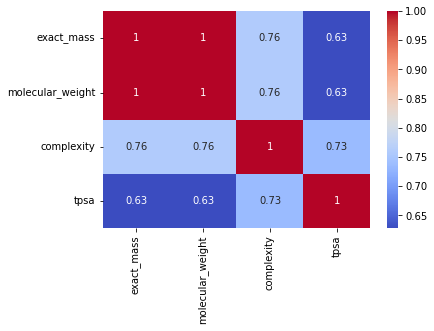

In [92]:
import seaborn as sns

# Create a heatmap of the correlation matrix
sns.heatmap(corr_matrix, cmap='coolwarm', annot=True)

In [93]:
from scipy.stats import pearsonr

for i in range(len(numeric_descriptors)):
    for j in range(i+1, len(numeric_descriptors)):
        desc1 = numeric_descriptors[i]
        desc2 = numeric_descriptors[j]
        corr, p_val = pearsonr(df[desc1], df[desc2])
        print(f"Correlation between {desc1} and {desc2}: {corr:.3f}, p-value: {p_val:.3f}")

Correlation between exact_mass and molecular_weight: 1.000, p-value: 0.000
Correlation between exact_mass and complexity: 0.760, p-value: 0.000
Correlation between exact_mass and tpsa: 0.628, p-value: 0.000
Correlation between molecular_weight and complexity: 0.760, p-value: 0.000
Correlation between molecular_weight and tpsa: 0.628, p-value: 0.000
Correlation between complexity and tpsa: 0.734, p-value: 0.000


These results indicate that there are strong positive correlations between all pairs of numeric descriptors. Specifically:

- exact_mass and molecular_weight have a perfect positive correlation (r=1.000), which indicates that they are essentially measuring the same thing and may be redundant.

- exact_mass and complexity have a strong positive correlation (r=0.760), which indicates that as exact_mass increases, so does complexity.

- exact_mass and tpsa have a moderate positive correlation (r=0.628), which indicates that there is some relationship between these two variables, but it is not as strong as the relationship between exact_mass and complexity.

- molecular_weight and complexity have a strong positive correlation (r=0.760), indicating that as molecular_weight increases, so does complexity.

- molecular_weight and tpsa have a moderate positive correlation (r=0.628), indicating some relationship between these two variables, but not as strong as the relationship between molecular_weight and complexity.

- complexity and tpsa have a strong positive correlation (r=0.734), indicating that as complexity increases, so does tpsa.


All of the p-values are very small (p-value: 0.000), indicating that the observed correlations are statistically significant and not due to chance.

In [94]:
# Investigate multicollinearity using variance inflation factor (VIF)
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Create a dataframe to store the VIFs
vif_df = pd.DataFrame(columns=['Descriptor', 'VIF'])

# Calculate the VIF for each descriptor
for i, descriptor in enumerate(numeric_descriptors):
    vif = variance_inflation_factor(df[numeric_descriptors].values, i)
    vif_df.loc[i] = [descriptor, vif]

# Print the results
print(vif_df)

         Descriptor            VIF
0        exact_mass  195152.544058
1  molecular_weight  195256.100645
2        complexity       3.543349
3              tpsa       3.126001


We store the VIFs in a dataframe and print the results. This allows us to see which descriptors have the highest degree of multicollinearity, and can help us decide which descriptors to include in a regression model.

C:\Users\bocha\AppData\Local\Temp\ipykernel_18100\158369594.py:9: DeprecationWarning:

`np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations



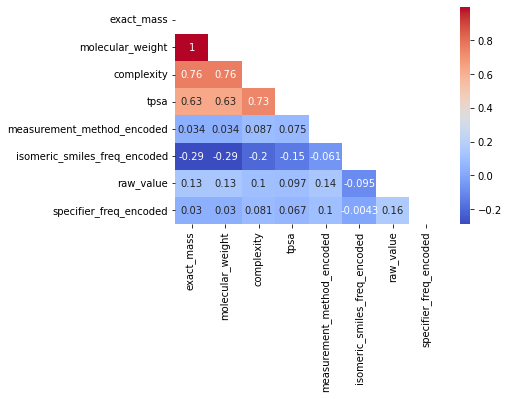

In [98]:
# Select only numeric descriptors
numeric_descriptors = ['exact_mass', 'molecular_weight', 'complexity', 'tpsa', 'measurement_method_encoded', 'isomeric_smiles_freq_encoded', 'raw_value', 'specifier_freq_encoded']
numeric_df = df[numeric_descriptors]

# Calculate the correlation matrix
cor_matrix = numeric_df.corr(method='pearson')

# Create a mask for the lower triangle
mask = np.zeros_like(cor_matrix, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Plot the heat map with the mask
sns.heatmap(cor_matrix, cmap='coolwarm', annot=True, mask=mask)

plt.show()

In [97]:
print(cor_matrix)

                              exact_mass  molecular_weight  complexity  \
exact_mass                      1.000000          0.999995    0.759657   
molecular_weight                0.999995          1.000000    0.759919   
complexity                      0.759657          0.759919    1.000000   
tpsa                            0.627875          0.627904    0.734475   
measurement_method_encoded      0.033708          0.033770    0.086783   
isomeric_smiles_freq_encoded   -0.288186         -0.288229   -0.204796   
raw_value                       0.134652          0.134534    0.102518   
specifier_freq_encoded          0.029671          0.029743    0.080811   

                                  tpsa  measurement_method_encoded  \
exact_mass                    0.627875                    0.033708   
molecular_weight              0.627904                    0.033770   
complexity                    0.734475                    0.086783   
tpsa                          1.000000               

- The **exact_mass** and **molecular_weight** descriptors are highly correlated with each other, with a correlation coefficient of 0.999995. This is expected, as **molecular_weight** is a function of **exact_mass**.

- The **complexity** descriptor has a moderate positive correlation with both **exact_mass** (0.759657) and **molecular_weight** (0.759919), indicating that larger and more complex molecules tend to have higher masses.

- The **tpsa** descriptor has a moderate positive correlation with **exact_mass** (0.627875) and **molecular_weight** (0.627904), indicating that larger molecules tend to have higher polar surface area.

- The **measurement_method_encoded** descriptor has weak positive correlations with most of the other descriptors, indicating that the choice of measurement method may have some minor influence on the other properties.

- The **isomeric_smiles_freq_encoded** descriptor has a moderate negative correlation with exact_mass (-0.288186) and **molecular_weight** (-0.288229), indicating that molecules with more isomers tend to have lower masses and molecular weights.

- The **raw_value** descriptor has a weak positive correlation with most of the other descriptors, indicating that it may be influenced by various molecular properties.

- The **specifier_freq_encoded** descriptor has a weak positive correlation with most of the other descriptors, indicating that it may be influenced by various molecular properties.

## Dimension reduction

In [ ]:
pd.set_option('display.max_rows', None)
# calculate the percentage of NaN values in each column
percent_missing = df.isna().mean() * 100
# print the result
print(percent_missing)

In [104]:
df_clear = df.dropna(subset=['ABC', 'fr_urea', 'BCUT2D_MRLOW', 'MinAbsPartialCharge', 'xlogp'])
print(df_clear.shape)

(1526, 1668)


### Non-negative Matrix Factorization

C:\Users\bocha\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\decomposition\_nmf.py:1665: ConvergenceWarning:

Maximum number of iterations 200 reached. Increase it to improve convergence.



<AxesSubplot: >

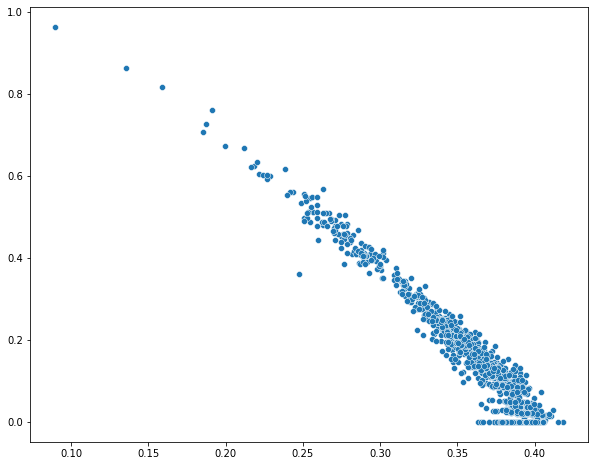

In [107]:
from sklearn.decomposition import NMF

# Select only numeric descriptors
numeric_df = df_clear.select_dtypes(include=['float64'])

# Apply NMF with 2 components
nmf = NMF(n_components=2)
nmf_components = nmf.fit_transform(numeric_df)

# Visualize the results
import seaborn as sns

# Set figure size
plt.figure(figsize=(10, 8))

sns.scatterplot(x=nmf_components[:, 0], y=nmf_components[:, 1])

NMF is a linear factorization method that factorizes a non-negative matrix into the product of two non-negative matrices with lower dimensions. NMF can be seen as a clustering method that groups together similar features. It is often used for feature extraction, and it can be useful when the data has a sparse and non-negative structure.

- Each component represents a group of features that are strongly related, and they can be named based on the features that are most strongly represented in the component.

- The sign of the components is arbitrary and can be flipped, meaning that a component with positive values can be interpreted in the same way as a component with negative values.

- The magnitude of the components represents the importance of the features in the component, so features with higher values are more important than features with lower values.

- The quality of the NMF results can be evaluated using metrics like the reconstruction error, which measures the difference between the original data and the data reconstructed from the NMF components. A lower reconstruction error indicates a better fit to the data.

In [135]:
import plotly.express as px

# create a new dataframe with the NMF components and a categorical variable
df_with_categories = pd.concat([pd.DataFrame(nmf_components), numeric_df['qed']], axis=1)

# create a scatter plot with points colored by category
fig = px.scatter(df_with_categories, x=0, y=1, color='qed')

# show the plot
fig.show()

### T-distributed stochastic neighbor embedding

T-distributed stochastic neighbor embedding (t-SNE) is a popular non-linear dimensionality reduction technique that is commonly used for visualizing high-dimensional data in a lower-dimensional space.

The goal of t-SNE is to take a high-dimensional dataset and project it onto a low-dimensional space (typically 2D or 3D) in a way that preserves the pairwise distances between the data points as much as possible. It achieves this by first computing pairwise similarity measures between the high-dimensional data points, and then constructing a lower-dimensional representation where the pairwise similarities are as similar as possible to the original similarities.

In [109]:
from sklearn.manifold import TSNE

# Fit t-SNE to the data
tsne = TSNE(n_components=2, perplexity=30, random_state=0)
df_tsne = tsne.fit_transform(numeric_df)

# Plot the results using plotly
import plotly.express as px

fig = px.scatter(x=df_tsne[:, 0], y=df_tsne[:, 1])
fig.show()

One of the key benefits of t-SNE is its ability to preserve the local structure of the data, which means that data points that are nearby in the high-dimensional space tend to be mapped to nearby points in the low-dimensional space. This often results in clusters of data points that correspond to different classes or groups in the data.

In [125]:
# Fit t-SNE to the data
tsne = TSNE(n_components=2, perplexity=30, random_state=0)
df_tsne = tsne.fit_transform(numeric_df)

df_tsne = pd.DataFrame(df_tsne, columns=["x", "y"])
df_tsne["MinPartialCharge"] = df_clear["MinPartialCharge"]

# Plot the results using plotly
fig = px.scatter(df_tsne, x="x", y="y", color="MinPartialCharge")
fig.show()

In [114]:
#numeric_df.to_csv('my_data.tsv', sep='\t', index=False)